# **Pix2PixGAN_RGB_Model**

# **Import Libraries**

In [ ]:
# Import necessary libraries
import os
import time
import datetime
import re
import cv2
import numpy as np
import matplotlib.pyplot as plt
import warnings
import tensorflow as tf
from PIL import Image
from sklearn.model_selection import train_test_split
from IPython.display import clear_output
from tensorflow.keras.callbacks import TensorBoard
import tensorflow_datasets as tfds

# Ignore warnings
warnings.filterwarnings('ignore')

# Set random seed
tf.random.set_seed(64)

# Autotune for optimization
AUTOTUNE = tf.data.AUTOTUNE

# **Cloning the FYP repository from my GitHub account**

In [ ]:
!git clone https://github.com/kevinrt001/FYP.git

fatal: destination path 'FYP' already exists and is not an empty directory.


# **Functions for Image Processing and File Handling**

In [ ]:
def extract_number(filename):

    """ Extract the leading number from a filename """

    match = re.search(r'\d+', filename)
    return int(match.group()) if match else 0

In [ ]:
def load_images(folder_path, num_images=None):
    """
    Load images from a folder as NumPy arrays.

    Args:
    - folder_path (str): Path to the folder containing the images.
    - num_images (int): Number of images to load. If None, all images will be loaded.

    Returns:
    - images_array (numpy.ndarray): NumPy array containing the images.
    """
    # List to store the images as NumPy arrays
    images = []

    # Get the list of files in the folder
    file_list = os.listdir(folder_path)

    # Sort files based on their numerical part
    file_list.sort(key=extract_number)

    # If num_images is specified, limit the file list to that number of files
    if num_images is not None:
        file_list = file_list[:num_images]

    # Loop through each file in the folder
    for file_name in file_list:
        # Load the image using PIL
        image_path = os.path.join(folder_path, file_name)
        image = Image.open(image_path)

        # Convert the image to a NumPy array and append to the list
        images.append(np.array(image))

    # Convert the list of images to a single NumPy array
    images_array = np.array(images)

    return images_array

In [ ]:
def crop_image_from_centre(image_list, new_height, new_width):
    """Crop images from the centre to the specified dimensions.

    Args:
        image_list (list): List of images to crop.
        new_height (int): New height for the cropped images.
        new_width (int): New width for the cropped images.

    Returns:
        np.array: Array of cropped images.
    """
    cropped_images = []
    for image in image_list:
        # Calculate the starting coordinates for cropping
        crop_x = image.shape[1] // 2 - new_width // 2
        crop_y = image.shape[0] // 2 - new_height // 2

        # Crop the image
        cropped_image = image[crop_y:crop_y+new_height, crop_x:crop_x+new_width, :]

        # Append the cropped image to the list
        cropped_images.append(cropped_image)

    return np.array(cropped_images)


In [ ]:
def resize_images(image_list, new_height, new_width):
    """Resize a list of images to the specified dimensions.

    Args:
        image_list (list): List of images to resize.
        new_height (int): New height for the resized images.
        new_width (int): New width for the resized images.

    Returns:
        np.array: Array of resized images.
    """
    resized_images = []
    for img in image_list:
        # Resize the image
        resized_img = cv2.resize(img, (new_width, new_height), interpolation=cv2.INTER_AREA)
        # Add the resized image to the new list
        resized_images.append(resized_img)

    return np.array(resized_images)

# **Data Loading and Preprocessing for Celeb Images**

In [ ]:
# Path to your data folder
data_folder_path = "/content/FYP/celeb_images"

total_num_of_images = 1250
num_of_train_images = total_num_of_images * 0.8 # - 1000 images
num_of_test_images = total_num_of_images * 0.2 # - 250 images

# List to store the images as NumPy arrays
celeb_images = load_images(data_folder_path, total_num_of_images)

celeb_images.shape

(1250, 218, 178, 3)

In [ ]:
# convert to float32
X = celeb_images.astype('float32')

# Splitting the data into training and testing sets (80% train, 20% test)
X_train, X_test = train_test_split(X, test_size=0.2, random_state=42)

print(f'Training set size: {len(X_train)}')
print(f'Testing set size: {len(X_test)}')
print("The shape of X_train is:", X_train.shape)
print("The shape of X_test is:", X_test.shape)

Training set size: 1000
Testing set size: 250
The shape of X_train is: (1000, 218, 178, 3)
The shape of X_test is: (250, 218, 178, 3)


In [ ]:
# Image dimensions for training and testing
image_height = 64
image_width = 64

# Temporary Image dimensions for random cropping in Data Augmentation Function later
upscaled_image_height = image_height * 2
upscaled_image_width = image_width * 2

In [ ]:
# Crop and resize the test images
X_test = crop_image_from_centre(X_test, upscaled_image_height, upscaled_image_width)
X_test = resize_images(X_test, image_height, image_width)

# Print the shapes of the datasets for training and testing
print("The shape of X_train is:", X_train.shape)
print("The shape of X_test is:", X_test.shape)

The shape of X_train is: (1000, 218, 178, 3)
The shape of X_test is: (250, 64, 64, 3)


# **Functions for Image Display and Conversion**

In [ ]:
def display_images(grayscale_image, original_image):
    """Display a pair of grayscale and original images.

    Args:
    grayscale_image (numpy.ndarray or tensorflow.Tensor): The grayscale image to display.
    original_image (numpy.ndarray or tensorflow.Tensor): The original RGB image to display.
    """
    # Normalize inputs if necessary
    if tf.reduce_max(grayscale_image) <= 1.0:
        grayscale_image = (grayscale_image + 1) * 127.5
        grayscale_image = grayscale_image.numpy().astype(np.uint8)

    if tf.reduce_max(original_image) <= 1.0:
        original_image = (original_image + 1) * 127.5
        original_image = original_image.numpy().astype(np.uint8)

    # Convert TensorFlow tensor to NumPy array if necessary
    if isinstance(grayscale_image, tf.Tensor):
        grayscale_image = grayscale_image.numpy()
    if isinstance(original_image, tf.Tensor):
        original_image = original_image.numpy()

    # Ensure pixel values are in the correct range (0 to 255)
    grayscale_image = grayscale_image.astype(np.uint8)
    original_image = original_image.astype(np.uint8)

    # Display images
    plt.figure(figsize=(8, 4))
    plt.subplot(1, 2, 1)
    plt.imshow(grayscale_image, cmap='gray')
    plt.title('Grayscale Image')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(original_image)
    plt.title('Original Image')
    plt.axis('off')
    plt.show()

In [ ]:
def convert_to_bw(image):
    """Convert an image to black and white (grayscale).

    Args:
    image (tensorflow.Tensor): The input RGB image.

    Returns:
    tuple: A tuple containing the grayscale image and the original RGB image.
    """
    # Convert the image to grayscale using the luminance formula (weighted sum of channels)
    bw_image = tf.image.rgb_to_grayscale(image)

    return bw_image, image

# **Data Preparation and Exploration**

In [ ]:
# Create a TensorFlow Dataset for training data
train_dataset = tf.data.Dataset.from_tensor_slices(X_train)

# Apply the 'convert_to_bw' function to create pairs of tensors
train_dataset = train_dataset.map(convert_to_bw, num_parallel_calls=tf.data.AUTOTUNE)

# Reduce the dataset to count the number of elements
num_elements = train_dataset.reduce(0, lambda x, _: x + 1).numpy()

print(f"Number of elements in train_dataset: {num_elements}")

for bw_image, rgb_image in train_dataset.take(1):
  print(f"Shape of bw_image: {bw_image.shape}")
  print(f"Shape of rgb_image: {rgb_image.shape}")

Number of elements in train_dataset: 1000
Shape of bw_image: (218, 178, 1)
Shape of rgb_image: (218, 178, 3)


In [ ]:
# Create a TensorFlow Dataset for testing data
test_dataset = tf.data.Dataset.from_tensor_slices(X_test)

# Apply the 'convert_to_bw' function to create pairs of tensors
test_dataset = test_dataset.map(convert_to_bw, num_parallel_calls=tf.data.AUTOTUNE)

# Reduce the dataset to count the number of elements
num_elements = test_dataset.reduce(0, lambda x, _: x + 1).numpy()

print(f"Number of elements in train_dataset: {num_elements}")

for bw_image, rgb_image in test_dataset.take(1):
  print(f"Shape of bw_image: {bw_image.shape}")
  print(f"Shape of rgb_image: {rgb_image.shape}")

Number of elements in train_dataset: 250
Shape of bw_image: (64, 64, 1)
Shape of rgb_image: (64, 64, 3)


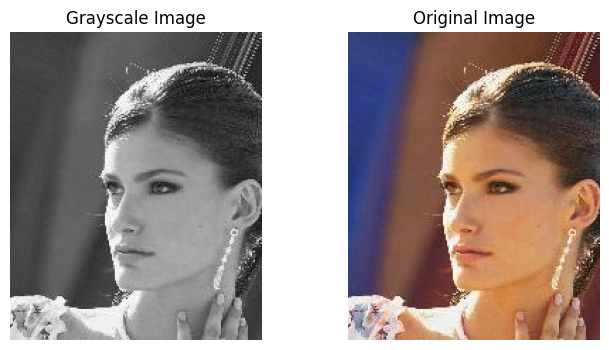

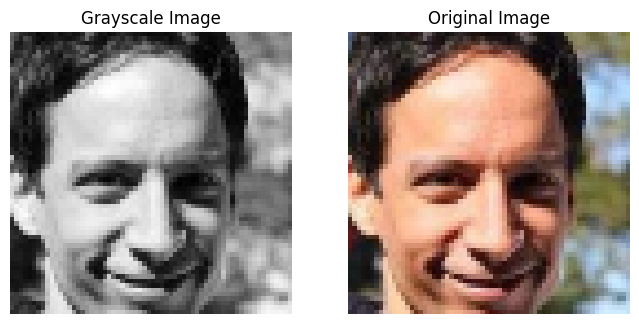

In [ ]:
# Iterate over the dataset and display a few samples

for grayscale_image, original_image in train_dataset.take(1):  # Take the first sample
    display_images(grayscale_image, original_image)

for grayscale_image, original_image in test_dataset.take(1):  # Take the first sample
    display_images(grayscale_image, original_image)

# **Functions for Data Augmentation**

In [ ]:
def resize_tensor_images(input_image, real_image, height, width):
    """
    Resize input and real images to the specified height and width.

    Args:
        input_image (tf.Tensor): Input image tensor.
        real_image (tf.Tensor): Real image tensor.
        height (int): Target height for resizing.
        width (int): Target width for resizing.

    Returns:
        tf.Tensor: Resized input image tensor.
        tf.Tensor: Resized real image tensor.
    """
    # Resize input and real images using nearest neighbor interpolation
    input_image = tf.image.resize(input_image, [height, width], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    real_image = tf.image.resize(real_image, [height, width], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

    return input_image, real_image


In [ ]:
def crop_tensor_image_from_centre(input_image, real_image, height, width):
    """
    Crop input and real images from the centre to the specified height and width.

    Args:
        input_image (tf.Tensor): Input image tensor.
        real_image (tf.Tensor): Real image tensor.
        height (int): Height of the cropped image.
        width (int): Width of the cropped image.

    Returns:
        tf.Tensor: Cropped input image tensor.
        tf.Tensor: Cropped real image tensor.
    """
    # Calculate the starting coordinates for cropping
    crop_x = tf.cast(tf.shape(input_image)[1] // 2 - width // 2, tf.int32)
    crop_y = tf.cast(tf.shape(input_image)[0] // 2 - height // 2, tf.int32)

    # Crop both input and real images
    cropped_input_image = tf.image.crop_to_bounding_box(input_image, crop_y, crop_x, height, width)
    cropped_real_image = tf.image.crop_to_bounding_box(real_image, crop_y, crop_x, height, width)

    return cropped_input_image, cropped_real_image

In [ ]:
def random_crop(input_image, real_image, height, width, crop_factor=0.2):
    """
    Randomly crop input and real images.

    Args:
        input_image (tf.Tensor): Input image tensor.
        real_image (tf.Tensor): Real image tensor.
        height (int): Height of the cropped image.
        width (int): Width of the cropped image.
        crop_factor (float): Crop factor for calculating the maximum offset. Defaults to 0.2.

    Returns:
        tf.Tensor: Cropped input image tensor.
        tf.Tensor: Cropped real image tensor.
    """
    # Calculate the maximum offset from the center
    max_offset_x = tf.cast(tf.shape(input_image)[1] - width, tf.float32) * crop_factor
    max_offset_y = tf.cast(tf.shape(input_image)[0] - height, tf.float32) * crop_factor

    # Generate random offset values
    offset_x = tf.random.uniform([], -max_offset_x, max_offset_x, dtype=tf.float32)
    offset_y = tf.random.uniform([], -max_offset_y, max_offset_y, dtype=tf.float32)

    # Calculate the crop coordinates with the offset
    crop_x = tf.cast(tf.shape(input_image)[1] // 2, tf.float32) - tf.cast(width // 2, tf.float32) + offset_x
    crop_y = tf.cast(tf.shape(input_image)[0] // 2, tf.float32) - tf.cast(height // 2, tf.float32) + offset_y

    # Crop both input and real images
    cropped_input_image = tf.image.crop_to_bounding_box(input_image, tf.cast(crop_y, tf.int32), tf.cast(crop_x, tf.int32), height, width)
    cropped_real_image = tf.image.crop_to_bounding_box(real_image, tf.cast(crop_y, tf.int32), tf.cast(crop_x, tf.int32), height, width)

    return cropped_input_image, cropped_real_image


In [ ]:
def normalize(input_image, real_image):
    """
    Normalize input and real images to the range [-1, 1].

    Args:
        input_image (tf.Tensor): Input image tensor.
        real_image (tf.Tensor): Real image tensor.

    Returns:
        tf.Tensor: Normalized input image tensor.
        tf.Tensor: Normalized real image tensor.
    """
    input_image = (input_image / 127.5) - 1
    real_image = (real_image / 127.5) - 1

    return input_image, real_image

In [ ]:
def random_flip(input_image, real_image):
    """
    Randomly flip input and real images horizontally.

    Args:
        input_image (tf.Tensor): Input image tensor.
        real_image (tf.Tensor): Real image tensor.

    Returns:
        tf.Tensor: Randomly flipped input image tensor.
        tf.Tensor: Randomly flipped real image tensor.
    """
    if tf.random.uniform(()) > 0.5:
        input_image = tf.image.flip_left_right(input_image)
        real_image = tf.image.flip_left_right(real_image)

    return input_image, real_image

In [ ]:
def random_jitter(input_image, real_image, height, width, num_augmentations=1):
    """
    Apply random jittering to input and real images including random crop, flip, and resize.

    Args:
        input_image (tf.Tensor): Input image tensor.
        real_image (tf.Tensor): Real image tensor.
        height (int): Height of the images.
        width (int): Width of the images.
        num_augmentations (int): Number of jittered images to generate.

    Returns:
        list of tf.Tensor: List of randomly jittered input image tensors.
        list of tf.Tensor: List of randomly jittered real image tensors.
    """
    input_images, real_images = [], []

    # Crop and resize the original images
    cropped_input_image, cropped_real_image = crop_tensor_image_from_centre(input_image, real_image, height*2, width*2)
    resized_input_image, resized_real_image = resize_tensor_images(cropped_input_image, cropped_real_image, height, width)
    input_images.append(resized_input_image)
    real_images.append(resized_real_image)

    # Apply random crop, flip, and resize for each augmentation
    for _ in range(num_augmentations):
        jittered_input_image, jittered_real_image = random_crop(input_image, real_image, height*2, width*2, 0.2)
        jittered_input_image, jittered_real_image = random_flip(jittered_input_image, jittered_real_image)
        jittered_input_image, jittered_real_image = resize_tensor_images(jittered_input_image, jittered_real_image, height, width)
        input_images.append(jittered_input_image)
        real_images.append(jittered_real_image)

    return input_images, real_images


In [ ]:
def preprocess_image_train(input_image, real_image, height, width, num_augmentations=1):
    """
    Preprocesses training images by normalizing and applying random jitter.

    Args:
        input_image (tf.Tensor): Input image tensor.
        real_image (tf.Tensor): Real image tensor.
        height (int): Height of the output images.
        width (int): Width of the output images.
        num_augmentations (int): Number of random jitter augmentations to apply.

    Returns:
        tf.Tensor: Preprocessed input image tensor.
        tf.Tensor: Preprocessed real image tensor.
    """
    input_image, real_image = normalize(input_image, real_image)
    input_images, real_images = random_jitter(input_image, real_image, height, width, num_augmentations)
    return input_images, real_images

In [ ]:
def preprocess_image_test(input_image, real_image, height, width):
    """
    Preprocesses test images by normalizing and resizing.

    Args:
        input_image (tf.Tensor): Input image tensor.
        real_image (tf.Tensor): Real image tensor.
        height (int): Height of the output images.
        width (int): Width of the output images.

    Returns:
        tf.Tensor: Preprocessed input image tensor.
        tf.Tensor: Preprocessed real image tensor.
    """
    input_image, real_image = normalize(input_image, real_image)
    input_image, real_image = resize_tensor_images(input_image, real_image, height, width)
    return input_image, real_image

# **Augment the Dataset**

In [ ]:
# Number of times to augment each image in the dataset
num_augmentations = 1

# Buffer size for shuffling the dataset
buffer_size = len(X_train) * num_augmentations

# Batch size for training
batch_size = 1

# Image dimensions
image_width = 64
image_height = 64

In [ ]:
# Augment the train_dataset

train_dataset = train_dataset.cache().flat_map(lambda input_image, real_image: tf.data.Dataset.from_tensor_slices(preprocess_image_train(input_image, real_image, image_height, image_width, num_augmentations)))

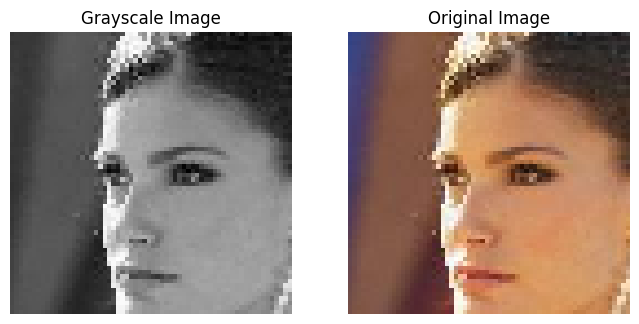

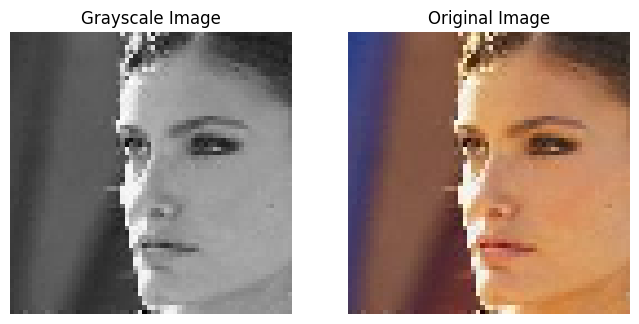

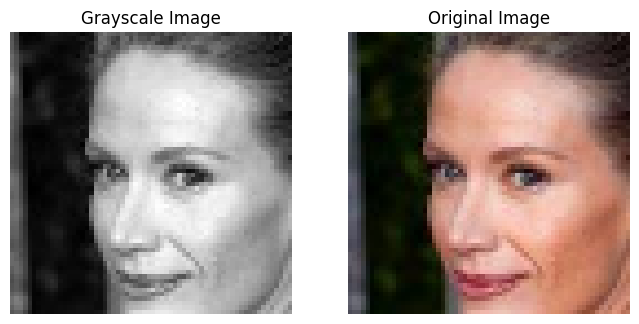

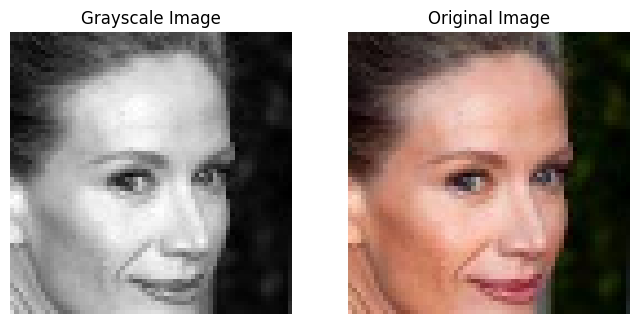

In [ ]:
# Iterate over the dataset and display a few samples

for grayscale_image, original_image in train_dataset.take(4):
    display_images(grayscale_image, original_image)

In [ ]:
# Shuffle the training dataset and create batches
train_dataset = train_dataset.shuffle(buffer_size).batch(batch_size)

# Reduce the dataset to count the number of elements
num_elements = train_dataset.reduce(0, lambda x, _: x + 1).numpy()

print(f"Number of elements in train_dataset: {num_elements}")

for bw_image, rgb_image in train_dataset.take(1):
  print(f"Shape of bw_image: {bw_image.shape}")
  print(f"Shape of rgb_image: {rgb_image.shape}")

Number of elements in train_dataset: 2000
Shape of bw_image: (1, 64, 64, 1)
Shape of rgb_image: (1, 64, 64, 3)


In [ ]:
test_dataset = test_dataset.map(lambda input_image, real_image: preprocess_image_test(input_image, real_image, image_height, image_width))
test_dataset = test_dataset.batch(batch_size)

# Reduce the dataset to count the number of elements
num_elements = test_dataset.reduce(0, lambda x, _: x + 1).numpy()

print(f"Number of elements in test_dataset: {num_elements}")

for bw_image, rgb_image in test_dataset.take(1):
  print(f"Shape of bw_image: {bw_image.shape}")
  print(f"Shape of rgb_image: {rgb_image.shape}")

Number of elements in test_dataset: 250
Shape of bw_image: (1, 64, 64, 1)
Shape of rgb_image: (1, 64, 64, 3)


# **Functions to create Generator & Discriminator**

In [ ]:
def downsample(filters, size, apply_batchnorm=True):
    """
    Create a downsample block consisting of a convolutional layer, optional batch normalization, and a LeakyReLU activation.

    Args:
        filters (int): Number of filters for the convolutional layer.
        size (int): Size of the convolutional filter.
        apply_batchnorm (bool): Whether to apply batch normalization after the convolutional layer. Default is True.

    Returns:
        tf.keras.Sequential: Downsample block.
    """
    initializer = tf.random_normal_initializer(0., 0.02)

    result = tf.keras.Sequential()
    result.add(
        tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                               kernel_initializer=initializer, use_bias=False))

    if apply_batchnorm:
        result.add(tf.keras.layers.BatchNormalization())

    result.add(tf.keras.layers.LeakyReLU())

    return result


In [ ]:
def upsample(filters, size, apply_dropout=False):
    """
    Create an upsample block consisting of a transposed convolutional layer, batch normalization, optional dropout, and ReLU activation.

    Args:
        filters (int): Number of filters for the transposed convolutional layer.
        size (int): Size of the transposed convolutional filter.
        apply_dropout (bool): Whether to apply dropout after the batch normalization layer. Default is False.

    Returns:
        tf.keras.Sequential: Upsample block.
    """
    initializer = tf.random_normal_initializer(0., 0.02)

    result = tf.keras.Sequential()
    result.add(
        tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                        padding='same',
                                        kernel_initializer=initializer,
                                        use_bias=False))

    result.add(tf.keras.layers.BatchNormalization())

    if apply_dropout:
        result.add(tf.keras.layers.Dropout(0.5))

    result.add(tf.keras.layers.ReLU())

    return result


In [ ]:
def Generator():
    """
    Build the generator network of the Pix2Pix GAN, which takes a grayscale image as input and generates a colorized image.

    Returns:
        tf.keras.Model: Generator model.
    """
    # Input shape is changed to [64, 64, 1]
    inputs = tf.keras.layers.Input(shape=[64, 64, 1])

    # Define the downsample layers
    down_stack = [
        downsample(64, 4, apply_batchnorm=False),
        downsample(128, 4),
        downsample(256, 4),
        downsample(512, 4),
        downsample(512, 4),
        downsample(512, 4),
    ]

    # Define the upsample layers
    up_stack = [
        upsample(512, 4, apply_dropout=True),
        upsample(512, 4, apply_dropout=True),
        upsample(512, 4, apply_dropout=True),
        upsample(256, 4),
        upsample(128, 4),
    ]

    # Initialize the weights of the layers
    initializer = tf.random_normal_initializer(0., 0.02)
    # Final convolutional layer to generate the colorized image
    last = tf.keras.layers.Conv2DTranspose(3, 4,
                                           strides=2,
                                           padding='same',
                                           kernel_initializer=initializer,
                                           activation='tanh')

    x = inputs

    # Downsampling through the model
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)

    skips = reversed(skips[:-1])

    # Upsampling and establishing the skip connections
    for up, skip in zip(up_stack, skips):
        x = up(x)
        # Concatenate with skip connection if shapes match
        if x.shape[1:3] == skip.shape[1:3]:
            x = tf.keras.layers.Concatenate()([x, skip])

    x = last(x)

    return tf.keras.Model(inputs=inputs, outputs=x)

In [ ]:
def Discriminator():
    """
    Build the discriminator network of the Pix2Pix GAN, which discriminates between real and generated images.

    Returns:
        tf.keras.Model: Discriminator model.
    """
    initializer = tf.random_normal_initializer(0., 0.02)

    # Input layers for the input and target images
    inp = tf.keras.layers.Input(shape=[64, 64, 3], name='input_image')
    tar = tf.keras.layers.Input(shape=[64, 64, 3], name='target_image')

    # Concatenate the input and target images along the channel axis
    x = tf.keras.layers.concatenate([inp, tar])

    # Downsample layers
    down1 = downsample(64, 4, apply_batchnorm=False)(x)
    down2 = downsample(128, 4)(down1)
    down3 = downsample(256, 4)(down2)

    # Zero padding and convolutional layer
    zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3)
    conv = tf.keras.layers.Conv2D(512, 4, strides=1,
                                  kernel_initializer=initializer,
                                  use_bias=False)(zero_pad1)

    # Batch normalization
    batchnorm1 = tf.keras.layers.BatchNormalization()(conv)

    # Leaky ReLU activation
    leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)

    # Second zero padding and convolutional layer
    zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu)

    # Final convolutional layer with linear activation
    last = tf.keras.layers.Conv2D(1, 4, strides=1,
                                  kernel_initializer=initializer)(zero_pad2)

    return tf.keras.Model(inputs=[inp, tar], outputs=last)

# **Hyperparameters, Loss Function, Optimizers**

In [ ]:
# Hyperparameters
LAMBDA = 100
# Loss function
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)
# Optimizers
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

# **Functions to calculate the Generator Loss and Discriminator Loss**

In [ ]:
def generator_loss(disc_generated_output, gen_output, target):
    """
    Calculates the total generator loss including GAN loss and L1 loss.

    Args:
        disc_generated_output (tf.Tensor): Discriminator output on generated images.
        gen_output (tf.Tensor): Generated images.
        target (tf.Tensor): Target images.

    Returns:
        tuple: Total generator loss, GAN loss, L1 loss.
    """
    gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)

    # Mean absolute error
    l1_loss = tf.reduce_mean(tf.abs(target - gen_output))

    total_gen_loss = gan_loss + (LAMBDA * l1_loss)

    return total_gen_loss, gan_loss, l1_loss


In [ ]:
def discriminator_loss(disc_real_output, disc_generated_output):
    """
    Calculates the total discriminator loss.

    Args:
        disc_real_output (tf.Tensor): Discriminator output on real images.
        disc_generated_output (tf.Tensor): Discriminator output on generated images.

    Returns:
        tf.Tensor: Total discriminator loss.
    """
    real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)
    generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)
    total_disc_loss = real_loss + generated_loss

    return total_disc_loss


# **Create the Generator and Discriminator models**

In [ ]:
# Create the generator model
generator = Generator()

# Print the model summary
generator.summary()

Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_3 (InputLayer)        [(None, 64, 64, 1)]          0         []                            
                                                                                                  
 sequential_28 (Sequential)  (None, 32, 32, 64)           1024      ['input_3[0][0]']             
                                                                                                  
 sequential_29 (Sequential)  (None, 16, 16, 128)          131584    ['sequential_28[0][0]']       
                                                                                                  
 sequential_30 (Sequential)  (None, 8, 8, 256)            525312    ['sequential_29[0][0]']       
                                                                                            

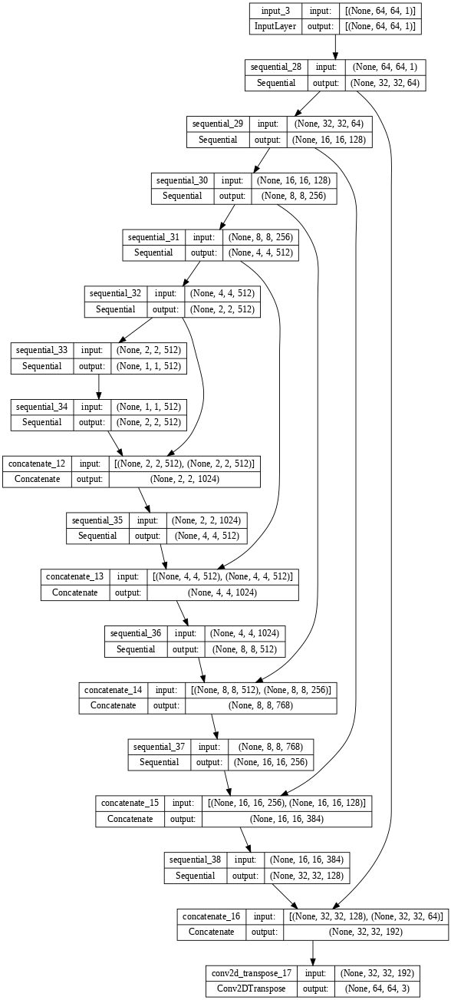

In [ ]:
tf.keras.utils.plot_model(generator, show_shapes=True, dpi=64)

In [ ]:
# Create the discriminator model

discriminator = Discriminator()
discriminator.summary()

Model: "model_5"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_image (InputLayer)    [(None, 64, 64, 3)]          0         []                            
                                                                                                  
 target_image (InputLayer)   [(None, 64, 64, 3)]          0         []                            
                                                                                                  
 concatenate_17 (Concatenat  (None, 64, 64, 6)            0         ['input_image[0][0]',         
 e)                                                                  'target_image[0][0]']        
                                                                                                  
 sequential_39 (Sequential)  (None, 32, 32, 64)           6144      ['concatenate_17[0][0]']

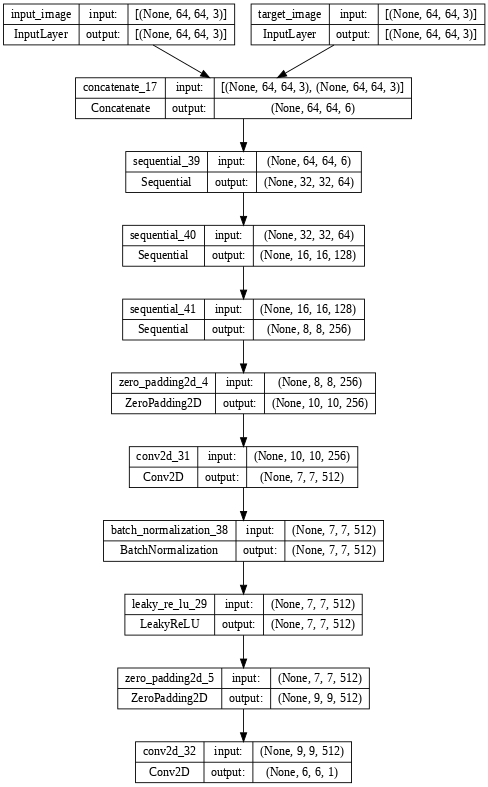

In [ ]:
tf.keras.utils.plot_model(discriminator, show_shapes=True, dpi=64)

# **Log the losses to TensorBoard**

In [ ]:
log_dir="logs/"

summary_writer = tf.summary.create_file_writer(
  log_dir + "fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

# **Functions for Training & Generating Images**

In [ ]:
def generate_images(model, test_input, tar):
    """
    Generate and display input image, ground truth, and predicted image.

    Args:
        model (tf.keras.Model): The generator model.
        test_input (tf.Tensor): Input image tensor.
        tar (tf.Tensor): Target image tensor.
    """
    prediction = model(test_input, training=True)
    plt.figure(figsize=(15, 15))

    display_list = [test_input[0], tar[0], prediction[0]]
    title = ['Input Image', 'Ground Truth', 'Predicted Image']

    for i in range(3):
        plt.subplot(1, 3, i+1)
        plt.title(title[i])
        # Getting the pixel values in the [0, 1] range to plot.
        if i == 0:
            plt.imshow(display_list[i], cmap='gray')
            plt.axis('off')
        else:
            plt.imshow(display_list[i] * 0.5 + 0.5)
            plt.axis('off')

    plt.show()


In [ ]:
def train_step(input_image, target, step):
    """
    Perform a single training step for the Pix2Pix GAN.

    Args:
        input_image (tf.Tensor): Input grayscale image tensor.
        target (tf.Tensor): Target RGB image tensor.
        step (int): Current training step.

    Returns:
        tuple: A tuple containing the generator total loss, generator GAN loss, and generator L1 loss.
    """
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        gen_output = generator(input_image, training=True)

        disc_real_output = discriminator([target, target], training=True)
        disc_generated_output = discriminator([gen_output, target], training=True)

        gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
        disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

    generator_gradients = gen_tape.gradient(gen_total_loss, generator.trainable_variables)
    discriminator_gradients = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(generator_gradients, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(discriminator_gradients, discriminator.trainable_variables))

    # Log metrics with summary writer
    with summary_writer.as_default():
        tf.summary.scalar('gen_total_loss', gen_total_loss, step=step)
        tf.summary.scalar('gen_gan_loss', gen_gan_loss, step=step)
        tf.summary.scalar('gen_l1_loss', gen_l1_loss, step=step)
        tf.summary.scalar('disc_loss', disc_loss, step=step)


In [ ]:
def fit(train_ds, test_ds, steps):
    """
    Fit the Pix2Pix GAN model on the training dataset.

    Args:
        train_ds (tf.data.Dataset): Training dataset.
        test_ds (tf.data.Dataset): Test dataset.
        steps (int): Number of training steps to perform.
    """
    example_input, example_target = next(iter(test_ds.take(1)))
    start = time.time()

    for step, (input_image, target) in train_ds.repeat().take(steps).enumerate():
        if (step) % 1000 == 0:

            if step != 0:
                print(f'Time taken for 1000 steps: {time.time()-start:.2f} sec\n')

            start = time.time()
            generate_images(generator, example_input, example_target)
            print(f"Step: {step//1000}k")

        train_step(input_image, target, step)

        # Training step
        if (step+1) % 10 == 0:
            print('.', end='', flush=True)



# **Training the Pix2PixGAN Model**

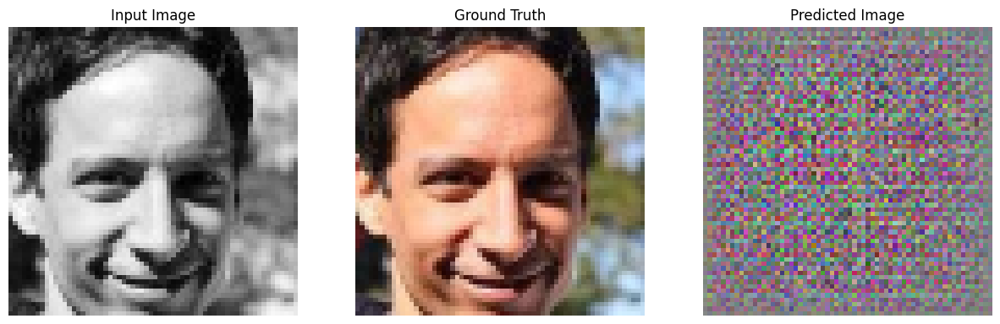

Step: 0k
....................................................................................................Time taken for 1000 steps: 182.88 sec



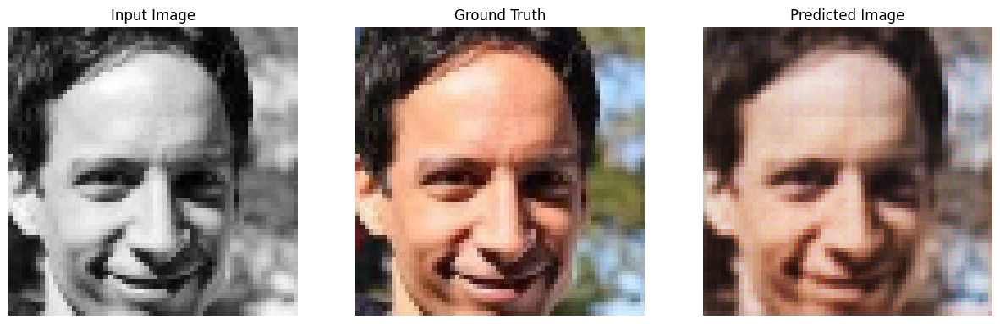

Step: 1k
....................................................................................................Time taken for 1000 steps: 179.99 sec



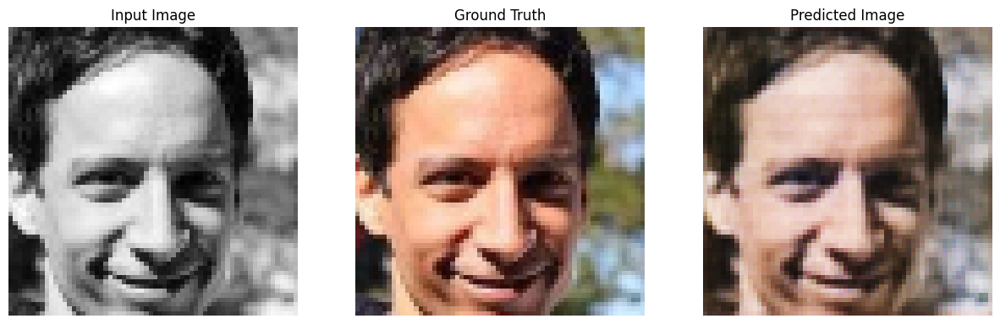

Step: 2k
....................................................................................................Time taken for 1000 steps: 180.50 sec



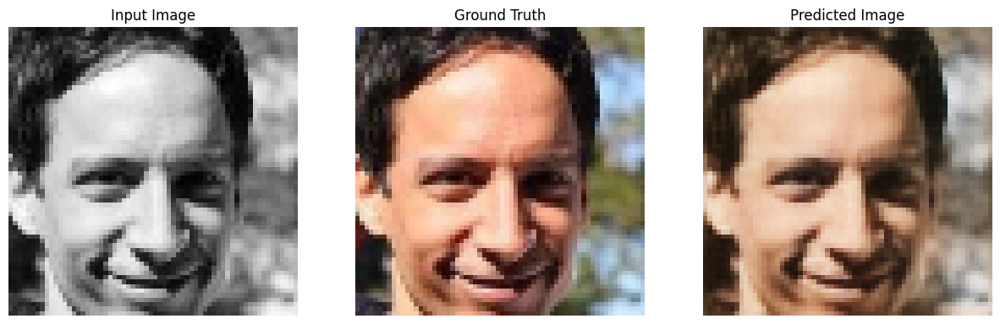

Step: 3k
....................................................................................................

In [ ]:
fit(train_dataset, test_dataset, steps=4000)

# **Visuialisation of the Losses over the training period**

In [ ]:
%load_ext tensorboard
%tensorboard --logdir {log_dir}

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 11044), started 4:15:48 ago. (Use '!kill 11044' to kill it.)

<IPython.core.display.Javascript object>

# **Predicted Images from Test Dataset**

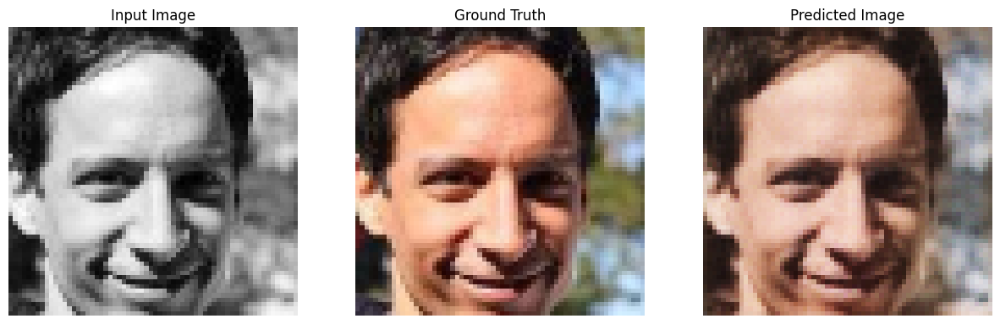

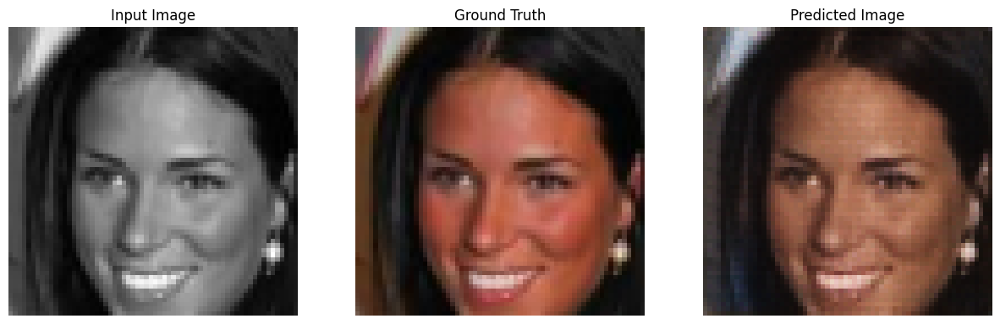

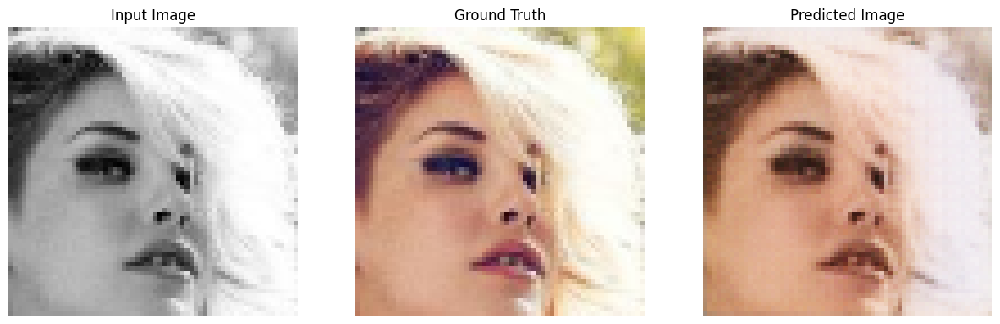

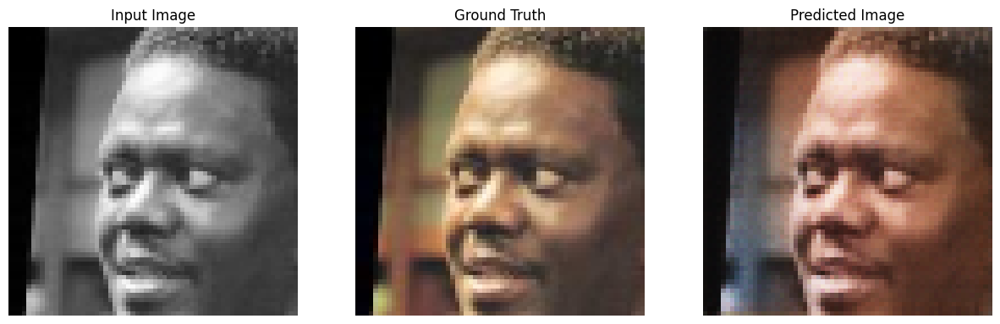

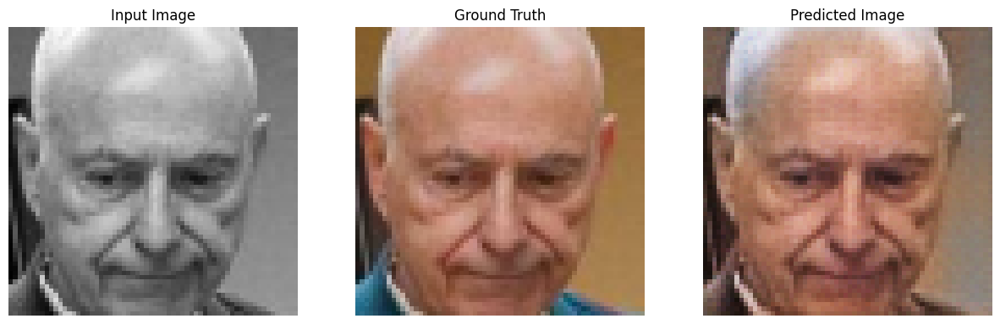

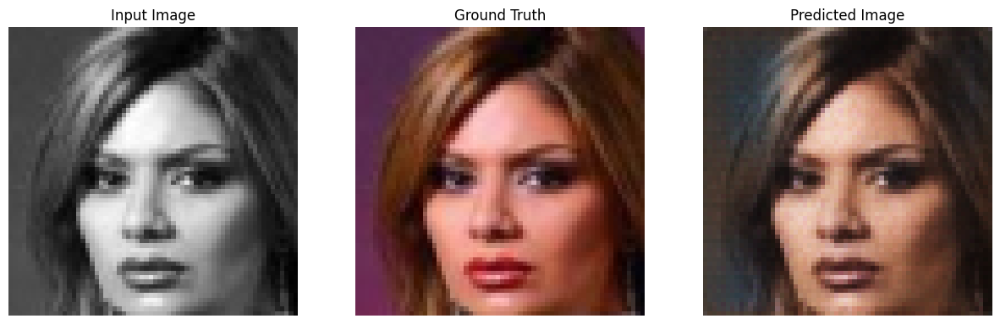

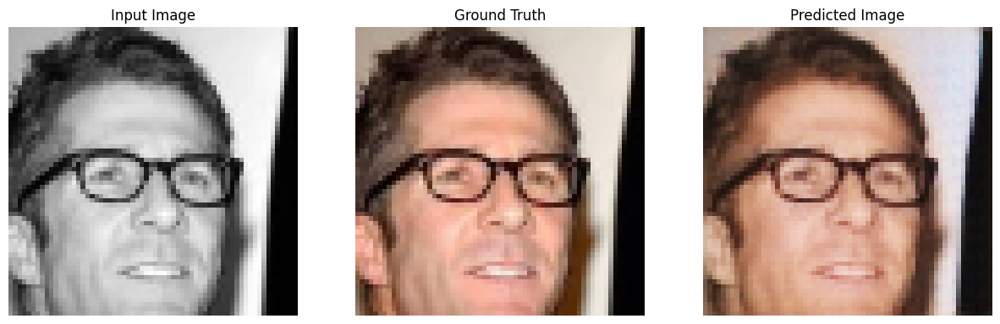

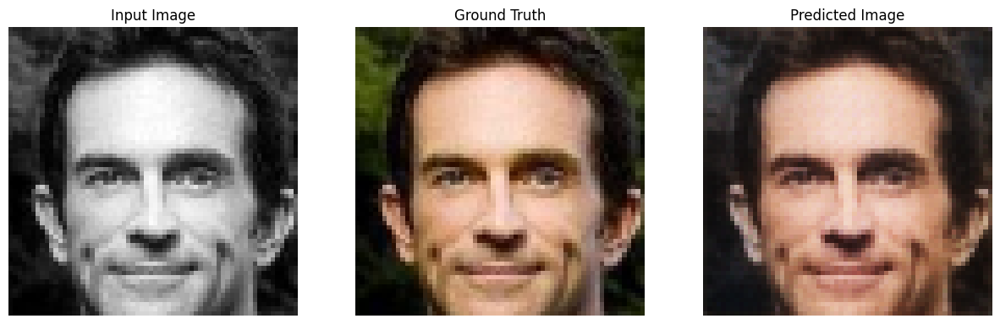

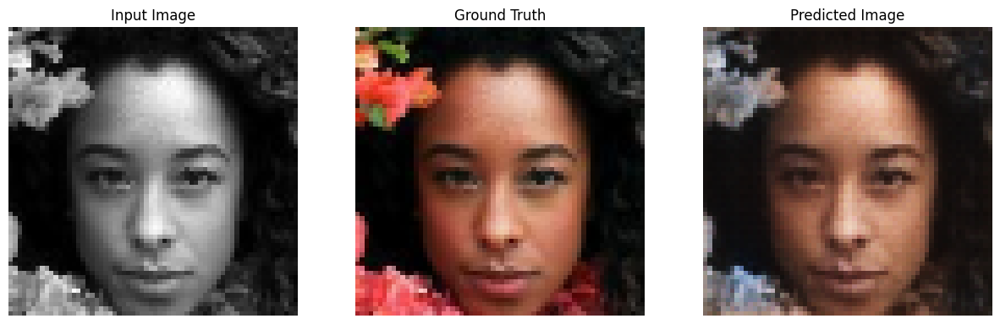

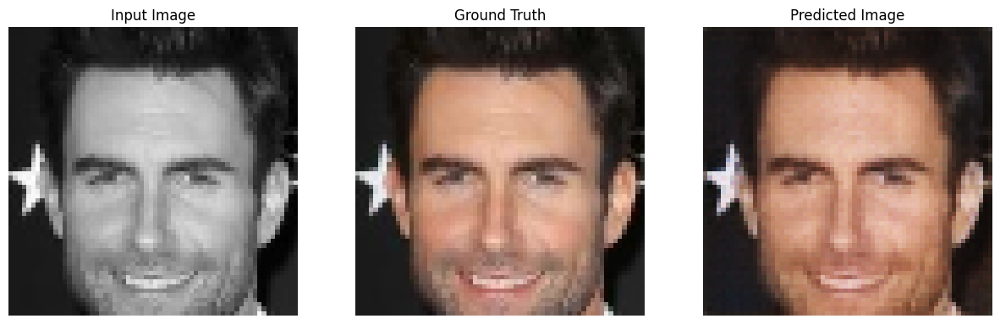

In [ ]:
for inp, tar in test_dataset.take(10):
  generate_images(generator, inp, tar)

# **Function for Preprocessing and Generating Images from my_family_historical_images Dataset**

In [ ]:
def preprocess_images(data_folder_path, target_height, target_width):
    """
    Preprocess images in a specified folder by converting them to grayscale and resizing them.

    Args:
        data_folder_path (str): Path to the folder containing the images.
        target_height (int): Target height for resizing the images.
        target_width (int): Target width for resizing the images.

    Returns:
        list: List of preprocessed images as NumPy arrays.
    """
    # Get a list of all files in the folder
    files = os.listdir(data_folder_path)

    # Filter out only the image files
    image_files = [file for file in files if file.lower().endswith(('.png', '.jpg', '.jpeg', '.gif', '.bmp'))]

    preprocessed_images = []

    for image_file in image_files:
        print("Processing image:", image_file)
        img_path = os.path.join(data_folder_path, image_file)
        img = cv2.imread(img_path)
        if img is None:
            print("Error reading image:", img_path)
            continue
        # Convert the image to grayscale
        grayscale_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        # Resize the image
        img_resized = cv2.resize(grayscale_img, (target_width, target_height), interpolation=cv2.INTER_NEAREST)
        preprocessed_images.append(img_resized)

    return preprocessed_images

In [ ]:
def normalize_image_2(input_image):
    """
    Normalize the input image to the range [-1, 1].

    Args:
        input_image (np.array): Input image array.

    Returns:
        np.array: Normalized image array.
    """
    input_image = (input_image / 127.5) - 1
    return input_image


In [ ]:
def colourise_images(model, test_input):
    """
    Generate colorized images from the input grayscale images using the provided model.

    Args:
        model (tf.keras.Model): Trained model for colorization.
        test_input (tf.Tensor): Input grayscale image tensor.

    Returns:
        None
    """
    prediction = model(test_input, training=True)

    display_list = [test_input[0], prediction[0]]
    title = ['Input Image', 'Predicted Image']

    plt.figure(figsize=(15, 15))

    for i in range(2):
        plt.subplot(1, 2, i+1)
        plt.title(title[i])

        if i == 0:
            plt.imshow(display_list[i], cmap='gray')
            plt.axis('off')
        else:
            plt.imshow(display_list[i] * 0.5 + 0.5)
            plt.axis('off')

    plt.show()


In [ ]:
# Path to your data folder
data_folder_path = "/content/FYP/my_family_historical_images"
target_height = 64
target_width = 64
my_family_historical_images = preprocess_images(data_folder_path, target_height, target_width)

Processing image: photo_6055627841678195283_y.jpg
Processing image: photo_6055627841678195280_y (1).jpg
Processing image: photo_6055627841678195281_y.jpg
Processing image: photo_6055627841678195287_y.jpg
Processing image: photo_6055627841678195278_y.jpg
Processing image: photo_6055627841678195286_y.jpg
Processing image: photo_6055627841678195282_y.jpg
Processing image: photo_6055627841678195279_y.jpg
Processing image: photo_6055627841678195284_y.jpg
Processing image: photo_6055627841678195279_y - Copy.jpg
Processing image: photo_6055627841678195283_y - Copy.jpg
Processing image: photo_6055627841678195285_y.jpg


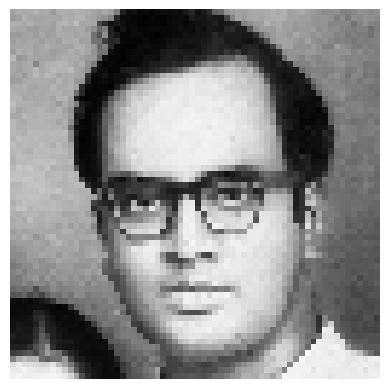

In [ ]:
plt.imshow(my_family_historical_images[0], cmap='gray')
plt.axis('off')  # Turn off axis numbers
plt.show()

In [ ]:
# Convert the list of preprocessed images to a NumPy array
my_family_historical_images = np.array(my_family_historical_images)

# Reshape the array to include a single channel
my_family_historical_images = my_family_historical_images.reshape(my_family_historical_images.shape + (1,))

# Print the shape of the array
print("Shape of my_family_historical_images array:", my_family_historical_images.shape)

Shape of my_family_historical_images array: (12, 64, 64, 1)


In [ ]:
# convert to float32

# Convert the list of images to a NumPy array
my_family_historical_dataset = np.array(my_family_historical_images)

my_family_historical_dataset = my_family_historical_dataset.astype('float32')

# Create a dataset from the tensor slices
my_family_historical_dataset = tf.data.Dataset.from_tensor_slices(my_family_historical_dataset)

my_family_historical_dataset = my_family_historical_dataset.map(lambda input_image: normalize_image_2(input_image))

# Batch the dataset with a batch size of 1
my_family_historical_dataset = my_family_historical_dataset.batch(1)

# **Predicted Images for my_family_historical_dataset**

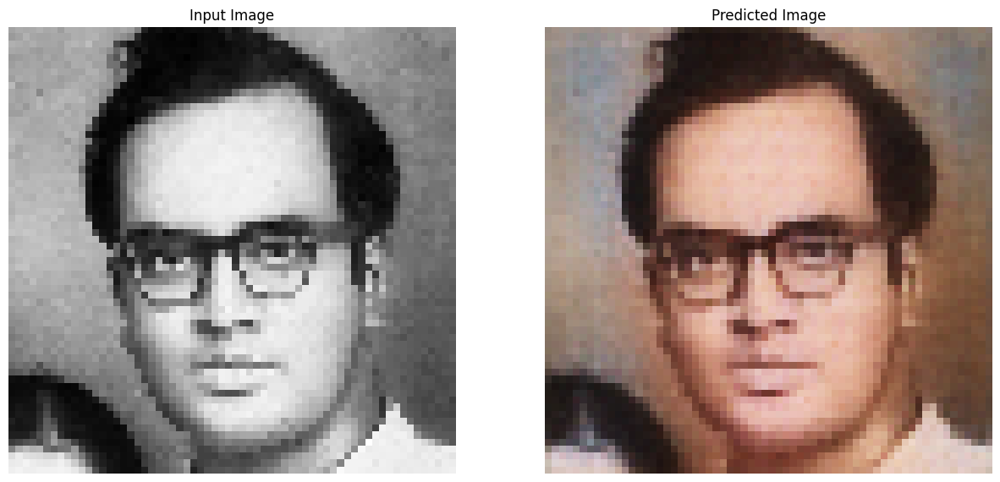

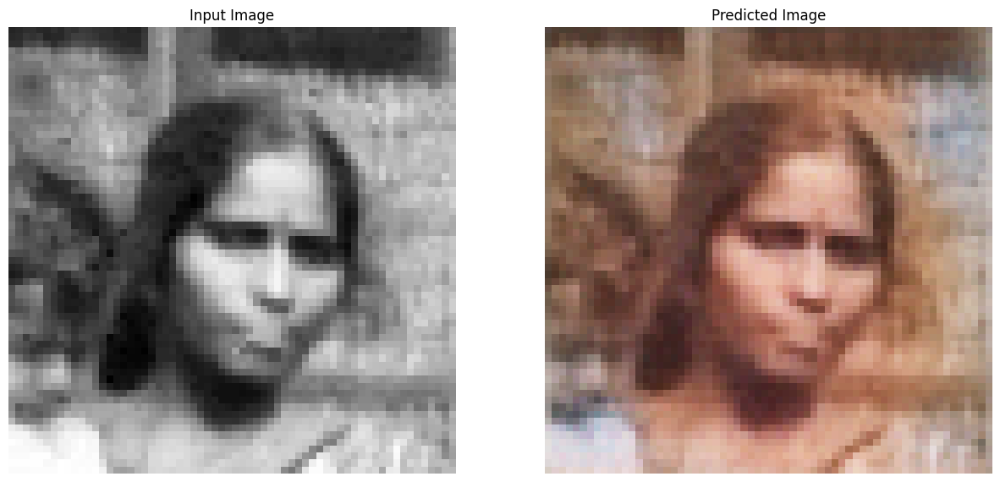

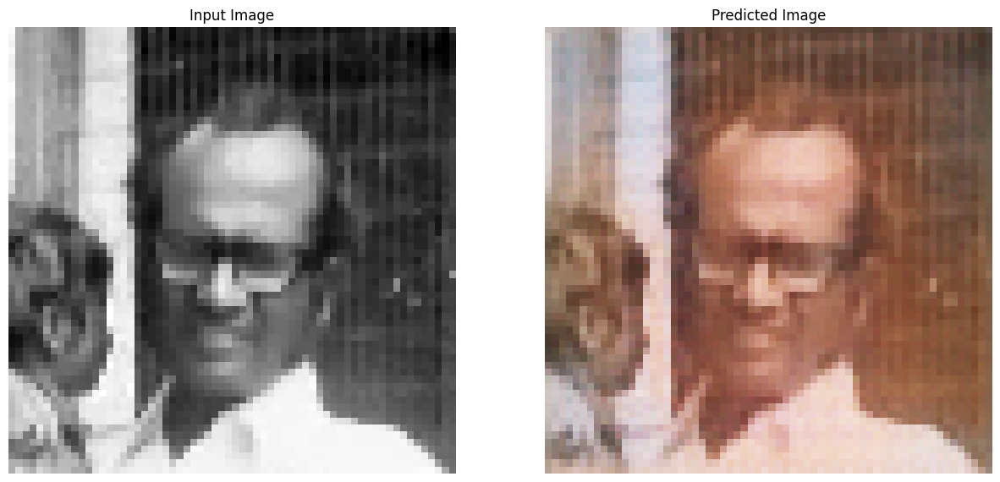

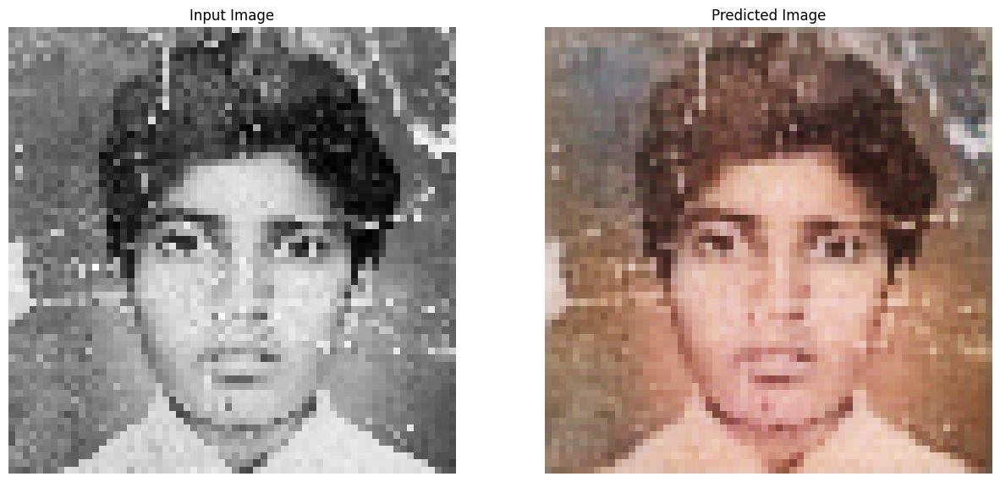

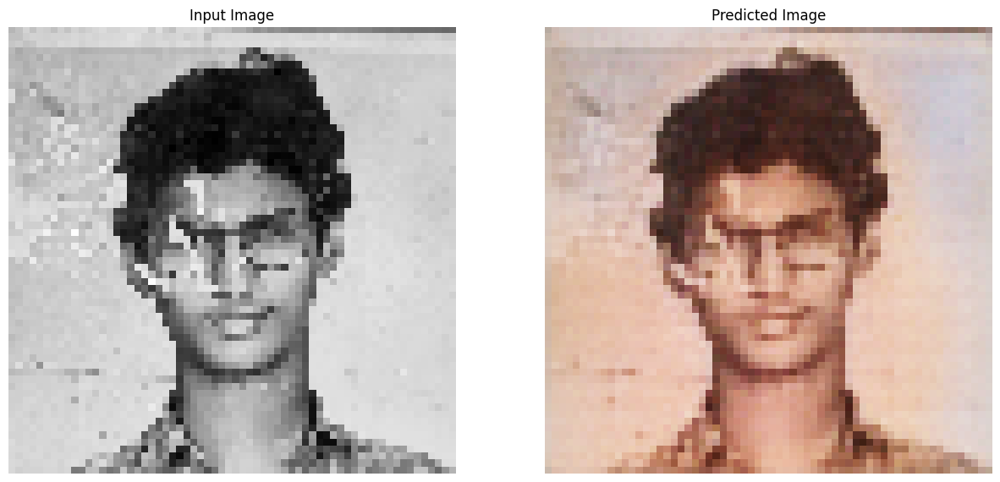

...

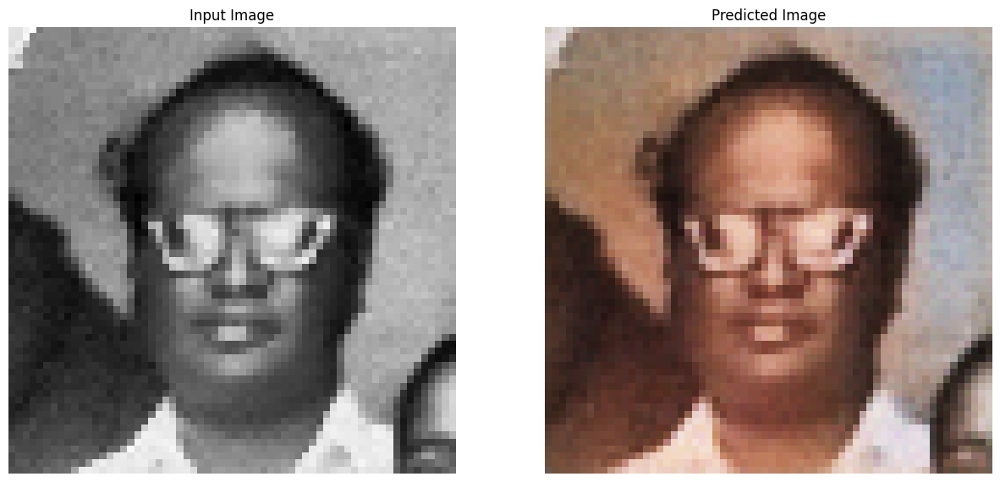

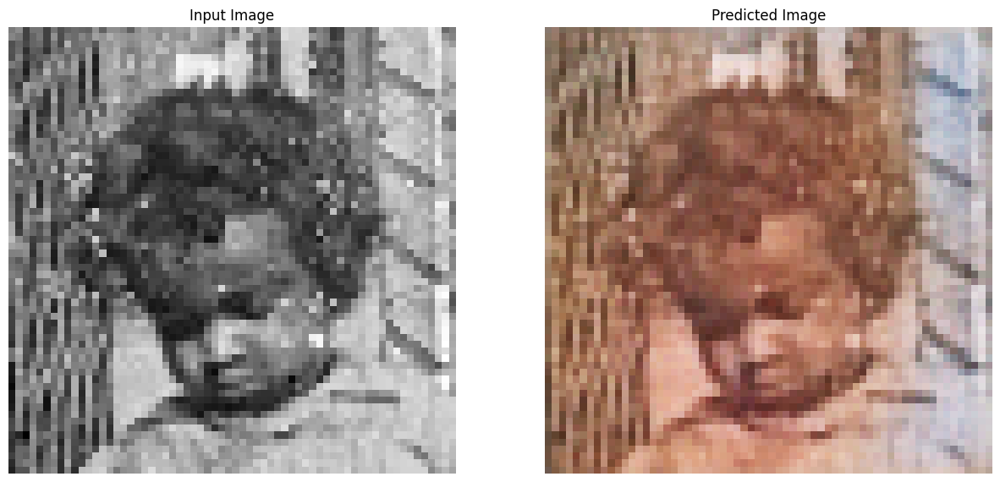

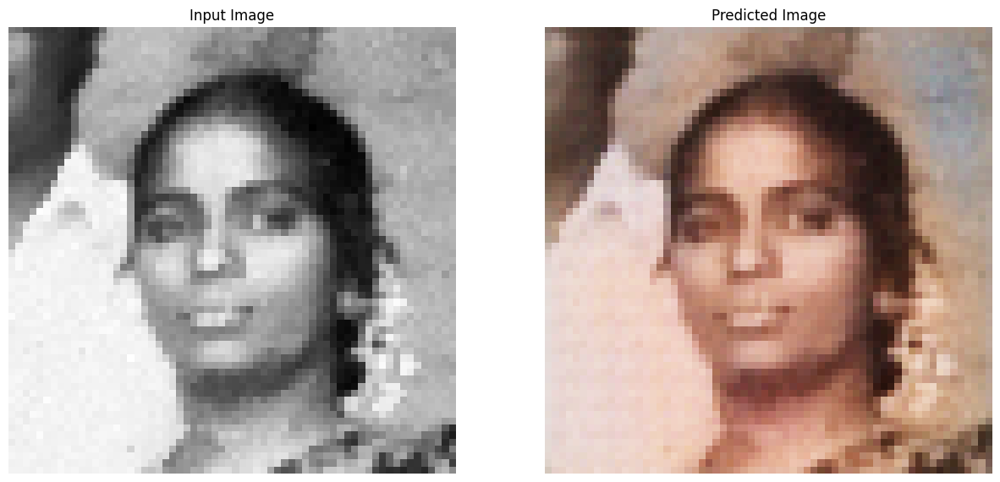

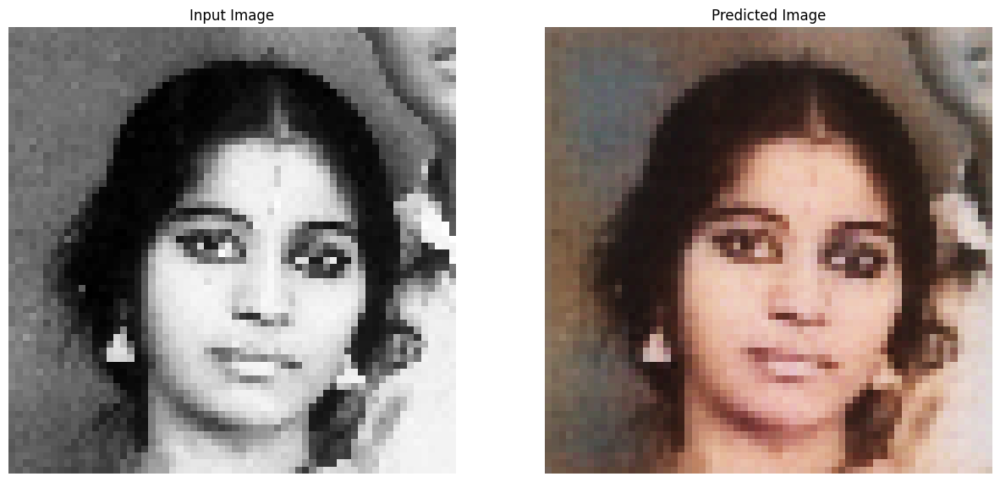

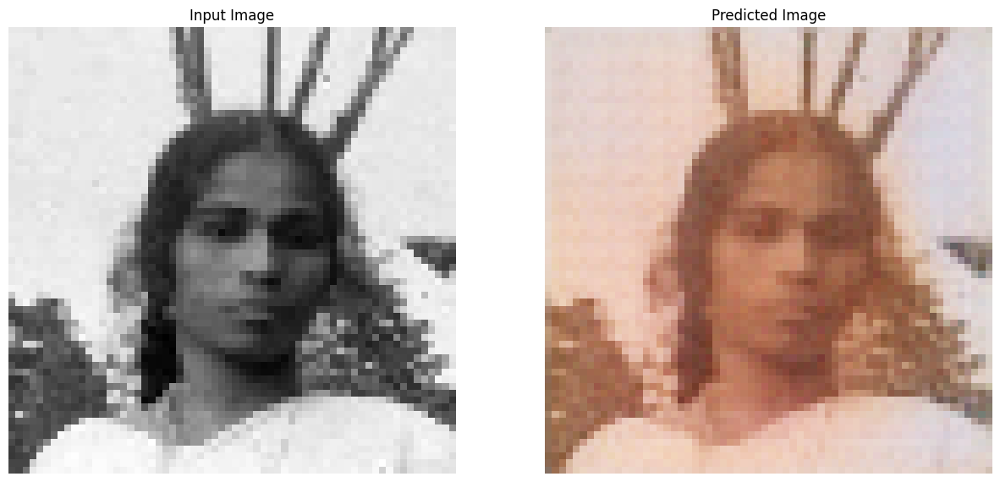

In [ ]:
for example_input in my_family_historical_dataset:

  colourise_images(generator, example_input)